In [2]:
import numpy as np
import pandas as pd 
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')

In [3]:
df1 = pd.read_csv('accelerometer.csv')
df = df1.copy()
df.head()

,wconfid,pctid,x,y,z
0,1,20,1.004,0.090,-0.125
1,1,20,1.004,-0.043,-0.125
2,1,20,0.969,0.090,-0.121
3,1,20,0.973,-0.012,-0.137
4,1,20,1.000,-0.016,-0.121


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153000 entries, 0 to 152999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   wconfid  153000 non-null  int64  
 1   pctid    153000 non-null  int64  
 2   x        153000 non-null  float64
 3   y        153000 non-null  float64
 4   z        153000 non-null  float64
dtypes: float64(3), int64(2)
memory usage: 5.8 MB


Due to the nature of accelerometer data potentially having zero values
     which can be handled more efficiently in a sparse representation.

     Akselerometr məlumatlarının təbiətinə görə potensial sıfır dəyərlərə sahib ola bilerik.

In [5]:
from pandas.api.types import is_sparse


def check_data(df):
    assert isinstance(df,pd.DataFrame)
    cols =  df.columns.tolist()
    sparse = []
    non_spars = []
    for col in cols:
        if pd.api.types.is_sparse(df[col]) == True:
            sparse.append(col)
        else:
            non_spars.append(col)
    return sparse == []

check_data(df) # if true than non spars data

True

In [6]:
df.describe()

,wconfid,pctid,x,y,z
count,153000.000000,153000.000000,153000.000000,153000.000000,153000.000000
mean,2.000000,60.000000,0.995622,0.005351,-0.117769
std,0.816499,24.494977,0.773958,0.742602,0.517008
min,1.000000,20.000000,-8.000000,-8.000000,-5.867000
25%,1.000000,40.000000,0.945000,-0.078000,-0.172000
50%,2.000000,60.000000,0.992000,0.008000,-0.125000
75%,3.000000,80.000000,1.039000,0.105000,-0.066000
max,3.000000,100.000000,7.996000,7.996000,6.086000


The vibration measurements were collected at a frequency of 20 ms for 1 min for each percentage, generating 3000 records per speed. Thus, in total, 153,000 vibration records were collected from the simulation model.

     Titrəmə ölçmələri hər Faiz üçün 20 dəqiqə ərzində 1 MS-də aparılmışdır və hər sürət üçün 3000 qeyd yaranıb. Beləliklə, simulyasiya modeli ilə ümumilikdə 153.000 vibrasiya qeydləri toplanıb.

In [7]:
df.shape

(153000, 5)

wconfid: Weight Configuration ID (1 - 'red' - normal configuration; 2 - 'blue' - perpendicular configuration; 3 - 'green' - opposite configuration)

     wconfid: çəki konfiqurasiya identifikatoru (1 - "qırmızı" - normal konfiqurasiya; 2 - "mavi" - perpendikulyar konfiqurasiya; 3 - "yaşıl" - əks konfiqurasiya)

In [8]:
df['wconfid'].value_counts()

wconfid
1    51000
2    51000
3    51000
Name: count, dtype: int64

pctid: Cooler Fan RPM Speed Percentage ID (20 means 20%, and so on).

     pctid: soyuducu fan rpm faiz identifikatoru (20 rəqəmi 20%. deməkdir).

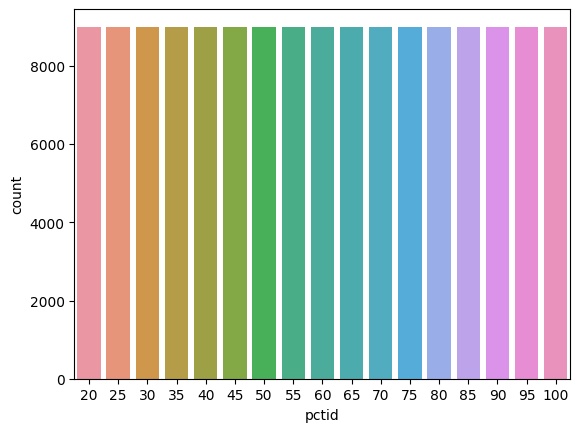

In [9]:
sns.countplot(data=df, x='pctid');

Təqdim olunan məlumat dəstində X, y və z atributları hər giriş üçün akselerometr ölçmələrini təmsil edir. Xüsusilə, bu atributlar soyuducu fanına qoşulmuş akselerometr tərəfindən toplanan vibrasiya məlumatlarını qeyd edir.

Hamısının eyni sayda qeydlərə (3000) sahib olmasının səbəbi, məlumat dəsti məlumatlarında təsvir olunan məlumat toplama üsulu ilə əlaqədardır. Fırlanma sürətinin (pctıd) hər faizi üçün vibrasiya ölçmələri 20 MS-də 1 dəqiqə ərzində aparılmışdır. Nəticədə, çəki konfiqurasiyasından (confıg) asılı olmayaraq sürətin hər faizi üçün cəmi 3000 qeyd əldə edildi.

Beləliklə, çəki konfiqurasiyasından və fırlanma sürətindən asılı olmayaraq, akselerometr ölçmələri (x, y, z) hər birləşmə üçün 3000 qeyddən ibarətdir və analiz və proqnozlaşdırma tapşırıqları üçün ardıcıl və standartlaşdırılmış məlumat dəsti quruluşunu təmin edir.

In [10]:
df.groupby(['wconfid', 'pctid']).count()

x     y     z
wconfid pctid                  
1       20     3000  3000  3000
        25     3000  3000  3000
        30     3000  3000  3000
        35     3000  3000  3000
        40     3000  3000  3000
        45     3000  3000  3000
        50     3000  3000  3000
        55     3000  3000  3000
        60     3000  3000  3000
        65     3000  3000  3000
        70     3000  3000  3000
        75     3000  3000  3000
        80     3000  3000  3000
        85     3000  3000  3000
        90     3000  3000  3000
        95     3000  3000  3000
        100    3000  3000  3000
2       20     3000  3000  3000
        25     3000  3000  3000
        30     3000  3000  3000
        35     3000  3000  3000
        40     3000  3000  3000
        45     3000  3000  3000
        50     3000  3000  3000
        55     3000  3000  3000
        60     3000  3000  3000
        65     3000  3000  3000
        70     3000  3000  3000
        75     3000  3000  3000
        80     3000  3000  3000
        85     3000  3000  3000
        90     3000  3000  3000
        95     3000  3000  3000
        100    3000  3000  3000
3       20     3000  3000  3000
        25     3000  3000  3000
        30     3000  3000  3000
        35     3000  3000  3000
        40     3000  3000  3000
        45     3000  3000  3000
        50     3000  3000  3000
        55     3000  3000  3000
        60     3000  3000  3000
        65     3000  3000  3000
        70     3000  3000  3000
        75     3000  3000  3000
        80     3000  3000  3000
        85     3000  3000  3000
        90     3000  3000  3000
        95     3000  3000  3000
        100    3000  3000  3000

Here we can see the first insight that as the fan speeds up the accelerometer values become further distributed.

     Burada görə bilərik ki, fan sürəti artdıqca akselerometr dəyərləri daha da yüksəlir.

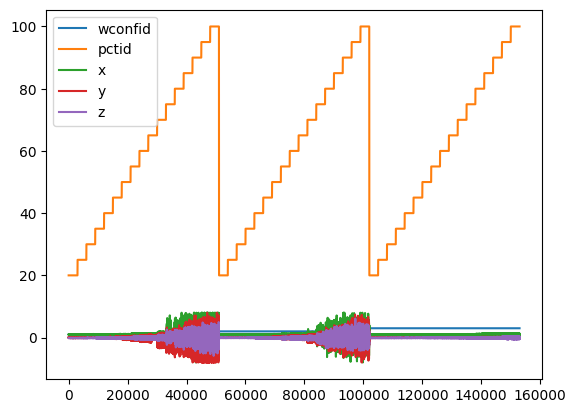

In [11]:
df.plot();

In [12]:
attributes = ['x', 'y', 'z']
subplot_titles = ["Box Plot: " + attr for attr in attributes]
fig = make_subplots(rows=len(attributes), cols=1, shared_xaxes=True, subplot_titles=subplot_titles)
for i, attr in enumerate(attributes):
    box_plot = px.box(df, x="pctid", y=attr)
    fig.add_trace(box_plot.data[0], row=i+1, col=1)

fig.update_layout(height=800, width=600, showlegend=False)

for i, attr in enumerate(attributes):
    fig.update_yaxes(title_text=attr, row=i+1, col=1)
    fig.update_xaxes(title_text="pctid", row=i+1, col=1)

fig.show()


By running this code, we can generate multiple heatmaps, each representing the standard deviations of 'x', 'y', and 'z' for a specific 'wconfid' group. This allows us to identify any differences or patterns in the variability of the variables across the groups.

     Bu kodu işlədərək, hər bir qrup üçün 'x', 'y' və 'z' standart sapmalarını təmsil edən bir neçə heatmap yarada bilerik. Bu, müxtəlif qruplardakı dəyişənlərin dəyişkənliyindəki fərqləri və ya nümunələri müəyyən etməyə imkan verir.

1


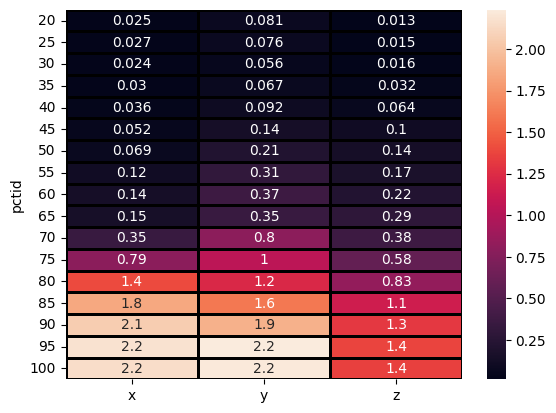

2


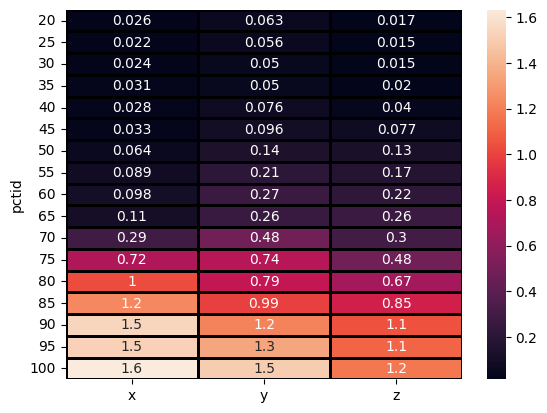

3


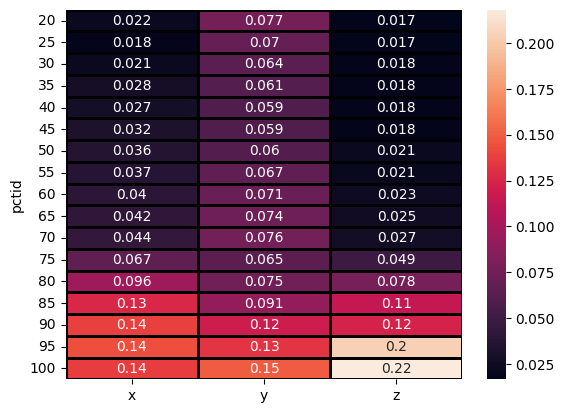

In [13]:
i = 1
while i < 4:
    stats_by_speed = df[df.wconfid==i].groupby('pctid')[['x','y','z']].std()
    print(i)
    i += 1
    sns.heatmap(stats_by_speed, annot=True, linewidths=1, linecolor='black')
    plt.show()

L2 Norm (Evklid məsafəsi )

L2 norması iki vektorun hər bir elementinin çıxılması, kvadratlaşdırılması, cəmlənməsi və köklənməsi ilə əldə edilir. Məsələn, əgər x=(1,2,3) və y=(-1,2,4) isə d(x,y)=root(4+0+1)=root(5). Əslində, orta məktəb riyaziyyatından verilən məsafə tərifi L2 Normudur. İki vektor (nöqtə) arasındakı düz xətt məsafəsidir.


![](https://img1-daumcdn-net.translate.goog/thumb/R1280x0/?scode=mtistory2&fname=https://blog.kakaocdn.net/dn/o1iTy/btqCOfgbW76/xv5PL4KWIDdrHAnvXdzTKK/img.png&_x_tr_sl=auto&_x_tr_tl=az&_x_tr_hl=en&_x_tr_pto=wapp)

 Yuxarıdakı şəkildə iki qara nöqtəni (vektorları) birləşdirən bir neçə xətt var. Vektorlar arasındakı məsafəni ölçən müxtəlif normaların qeydidir. Burada yaşıl xətt ən çox tanış olduğumuz Evklid məsafəsi və ya L2 Normudur. Yalnız bir hal ola bilər. Bununla belə, qırmızı, mavi və sarı xətlərin qalan hissəsi müxtəlif yolları gəzir, lakin əslində hamısı eyni L1 Normudur.

In [14]:
def l2(df):
    return np.round(np.sqrt(df.loc['x']**2 + df.loc['y']**2 + df.loc['z']**2), 4)

df['l2'] = df.apply(l2, axis=1)
df.head()

,wconfid,pctid,x,y,z,l2
0,1,20,1.004,0.090,-0.125,1.0157
1,1,20,1.004,-0.043,-0.125,1.0127
2,1,20,0.969,0.090,-0.121,0.9807
3,1,20,0.973,-0.012,-0.137,0.9827
4,1,20,1.000,-0.016,-0.121,1.0074


In [15]:
sc =StandardScaler()
cols = df.columns
l =sc.fit_transform(df)
df = pd.DataFrame(l,columns= cols)

In [16]:
X=df.drop(['l2'],axis=1)
y=df['l2']

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [18]:
X_test, X_validation, y_test, y_validation = train_test_split(X_test, y_test, test_size=0.5, random_state=101)

Xgboost_Regressor

In [19]:
import xgboost as xgb

In [20]:
xg_reg = xgb.XGBRegressor(colsample_bytree=0.8, learning_rate=0.1, max_depth=6, n_estimators=1000, verbosity=3)

In [21]:
xg_reg.fit(X_train, y_train)

[04:03:38] DEBUG: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:157: Using tree method: 2
[04:03:38] INFO: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\tree\updater_prune.cc:98: tree pruning end, 94 extra nodes, 0 pruned nodes, max_depth=6
[04:03:38] INFO: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\tree\updater_prune.cc:98: tree pruning end, 90 extra nodes, 0 pruned nodes, max_depth=6
[04:03:38] INFO: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\tree\updater_prune.cc:98: tree pruning end, 92 extra nodes, 0 pruned nodes, max_depth=6
[04:03:39] INFO: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\tree\updater_pr

EVALUATE

In [ ]:
y_pred = xg_reg.predict(X_test)

For mean absolute error (MAE) and coefficient of determination (R-squared), they are commonly used for regression tasks, where both the true and predicted values are continuous numerical variables. These metrics do not require categorical variables.

     Orta mütləq səhv (MAE) və təyinetmə əmsalı (R-kvadrat) baxımından bunlar ümumiyyətlə həm həqiqi, həm də proqnozlaşdırılan dəyərlərin davamlı ədədi dəyişənlər olduğu reqressiya problemləri üçün istifadə olunur. Bu göstəricilər kategorik dəyişənlər tələb etmir.

In [ ]:
print(metrics.mean_absolute_error(y_test, y_pred))
print(metrics.r2_score(y_test, y_pred))

0.007443252482349042
0.9993489685929066


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

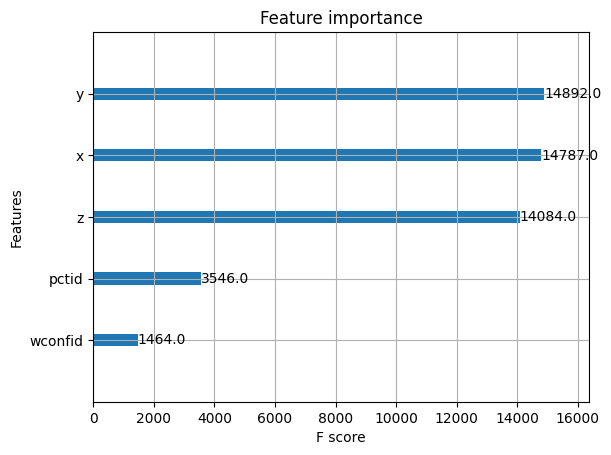

In [ ]:
xgb.plot_importance(xg_reg)

In [ ]:
from sklearn.model_selection import GridSearchCV
model = xgb.XGBRegressor()
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 500, 1000],
    'colsample_bytree': [0.2,0.4,0.6,0.8,0.10,0.12]
}
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='neg_mean_absolute_error')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", best_params)


Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 1000}


In [ ]:
y_pred = best_model.predict(X_test)
mae = metrics.mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE) on Test Set:", mae)

Mean Absolute Error (MAE) on Test Set: 0.007096217813301065


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

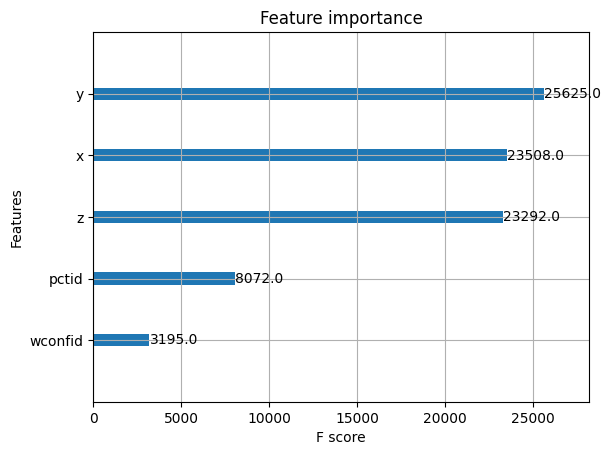

In [ ]:
xgb.plot_importance(best_model)